In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.neighbors import KernelDensity

import pandasql as pdsql
pysql = lambda q: pdsql.sqldf(q, globals())

from sklearn import linear_model
# from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.feature_selection import SelectFromModel
from sklearn.cross_validation import train_test_split

/usr/local/lib64/python3.4/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


In [2]:
mapdata = np.loadtxt("/mnt/lynx/python_tutorial/mapdata_copyright_openstreetmap_contributors.txt")
train = pd.read_csv('/mnt/lynx/python_tutorial/train.csv')
spray = pd.read_csv('/mnt/lynx/python_tutorial/spray.csv')
weather = pd.read_csv('/mnt/lynx/python_tutorial/weather.csv')

In [42]:
weather.head()

,Station,Date,Tmax,Tmin,Tavg,Depart,DewPoint,WetBulb,Heat,Cool,...,CodeSum,Depth,Water1,SnowFall,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,1,2007-05-01,83,50,67,14,51,56,0,2,...,,0,M,0.0,0.00,29.10,29.82,1.7,27,9.2
1,2,2007-05-01,84,52,68,M,51,57,0,3,...,,M,M,M,0.00,29.18,29.82,2.7,25,9.6
2,1,2007-05-02,59,42,51,-3,42,47,14,0,...,BR,0,M,0.0,0.00,29.38,30.09,13.0,4,13.4
3,2,2007-05-02,60,43,52,M,42,47,13,0,...,BR HZ,M,M,M,0.00,29.44,30.08,13.3,2,13.4
4,1,2007-05-03,66,46,56,2,40,48,9,0,...,,0,M,0.0,0.00,29.39,30.12,11.7,7,11.9


In [3]:
weather_avg = pysql("""
SELECT Date, avg(Tmax) as Tmax, avg(Tmin) as Tmin, avg(Tavg) as Tavg, avg(DewPoint) as DewPoint,
avg(WetBulb) WetBulb, avg(Heat) heat,
avg(Cool) as Cool, 
avg(Sunrise) as Sunrise, 
max(Sunset) as Sunset, 
avg(PrecipTotal) as PrecipTotal, 
avg(StnPressure) as StnPressure, 
avg(SeaLevel) as SeaLevel, 
avg(ResultSpeed) as ResultSpeed, 
avg(ResultDir) as ResultDir, 
avg(AvgSpeed) as AvgSpeed
from weather group by Date
;
""")

weather_avg

,Date,Tmax,Tmin,Tavg,DewPoint,WetBulb,heat,Cool,Sunrise,Sunset,PrecipTotal,StnPressure,SeaLevel,ResultSpeed,ResultDir,AvgSpeed
0,2007-05-01,83.5,51.0,67.5,51.0,56.5,0.0,2.5,224.0,1849,0.000,29.140,29.820,2.20,26.0,9.40
1,2007-05-02,59.5,42.5,51.5,42.0,47.0,13.5,0.0,223.5,1850,0.000,29.410,30.085,13.15,3.0,13.40
2,2007-05-03,66.5,47.0,57.0,40.0,49.0,8.0,0.0,223.0,1851,0.000,29.425,30.120,12.30,6.5,12.55
3,2007-05-04,72.0,50.0,29.0,41.5,50.0,3.5,0.0,222.0,1852,0.000,29.335,30.045,10.25,7.5,10.60
4,2007-05-05,66.0,53.5,60.0,38.5,49.5,5.0,0.0,221.5,1853,0.000,29.430,30.095,11.45,7.0,11.75
5,2007-05-06,68.0,50.5,59.5,30.0,46.0,5.5,0.0,221.0,1855,0.000,29.595,30.285,14.10,10.5,14.75
6,2007-05-07,83.5,48.5,66.0,40.0,53.5,0.0,1.0,220.5,1856,0.000,29.410,30.120,8.55,17.5,10.20
7,2007-05-08,81.0,57.0,69.0,57.5,62.5,0.0,4.0,219.5,1857,0.000,29.325,30.025,2.60,9.5,5.60
8,2007-05-09,76.5,62.0,69.5,59.5,63.0,0.0,4.5,219.0,1858,0.075,29.245,29.935,3.90,8.0,6.05
9,2007-05-10,83.5,57.5,70.5,52.0,60.5,0.0,5.5,218.5,1859,0.000,29.230,29.915,1.35,13.0,4.00


In [194]:
pysql("""select substr(Date, 1, 4), sum(NumMosquitos), sum(WnvPresent), count(*)
from train group by substr(Date, 1, 4)""")

,"substr(Date, 1, 4)",sum(NumMosquitos),sum(WnvPresent),count(*)
0,2007,58688,236,3811
1,2009,21108,19,2249
2,2011,18799,57,2054
3,2013,36444,239,2392


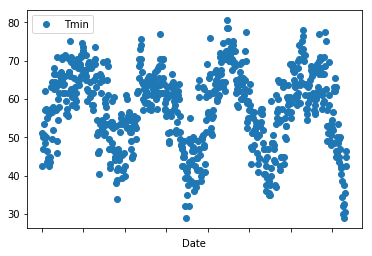

In [202]:
weather2007_2009 = pysql("""select * from weather_avg where substr(Date, 1, 4) in ('2007', '2009', '2011', '2013')""")

weather2007_2009.plot(x='Date', y='Tmin', style='o')

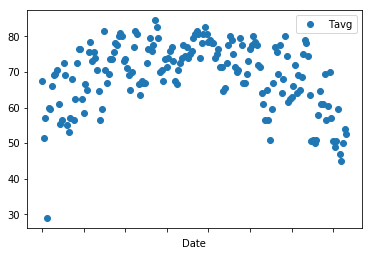

In [33]:
weather2007 = pysql("""select * from weather_avg where substr(Date, 1, 4) = '2007'""")
weather2007.plot(x='Date', y='Tavg', style='o')

In [5]:
train_weather = pysql("""select sum(NumMosquitos) NumMosquitos, max(WnvPresent) WnvPresent, sum(WnvPresent) WnvPresent_location,
Date, avg(Tmax) as Tmax, avg(Tmin) as Tmin, avg(Tavg) as Tavg, avg(DewPoint) as DewPoint,
avg(WetBulb) WetBulb, avg(Heat) heat,
avg(Cool) as Cool, 
avg(Sunrise) as Sunrise, 
max(Sunset) as Sunset, 
avg(PrecipTotal) as PrecipTotal, 
avg(StnPressure) as StnPressure, 
avg(SeaLevel) as SeaLevel, 
avg(ResultSpeed) as ResultSpeed, 
avg(ResultDir) as ResultDir, 
avg(AvgSpeed) as AvgSpeed,
sum(NumMosquitos) NumMosquitos2
from
(select a.NumMosquitos, a.WnvPresent, b.*
                      from train a
                      left join weather_avg b
                      on a.Date = b.Date) t
                      group by Date
                      """)


In [136]:
df = pysql("""select 
a.WnvPresent, 
a.NumMosquitos,
a.Species,
a.Trap,
Tmax,
Tmin,
Tavg,
DewPoint,
WetBulb,
heat,
Cool,
Sunrise,
Sunset,
PrecipTotal,
StnPressure,
SeaLevel,
ResultSpeed,
ResultDir,
AvgSpeed

                      from train a
                      left join weather_avg b
                      on a.Date = b.Date
                      """)
# df

In [138]:
df_cat = df.select_dtypes(include = ['object'])
df_num = df.select_dtypes(exclude = ['object'])
df_dummy = pd.get_dummies(df_cat)
df2 = pd.concat([df_num, df_dummy], axis = 1)

In [139]:
X, y = df2.iloc[:, 1:], df2.iloc[:, 0].values

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3)
logreg = linear_model.LogisticRegression()
logreg.fit(X_train, y_train)
model = SelectFromModel(logreg, prefit=True)

In [140]:
pd.DataFrame(list(zip(X.columns, np.transpose(model.get_support()))))

,0,1
0,NumMosquitos,False
1,Tmax,False
2,Tmin,False
3,Tavg,True
4,DewPoint,False
5,WetBulb,False
6,heat,True
7,Cool,True
8,PrecipTotal,False
9,StnPressure,True


In [141]:
logreg.score(X_train, y_train)

0.9503671471308132

In [142]:
logreg.score(X_test, y_test)

0.9432106598984772

In [144]:
from sklearn import svm

svm_model = svm.LinearSVC(C=1.0, class_weight=None, dual=True, fit_intercept=True,
     intercept_scaling=1, loss='squared_hinge', max_iter=1000,
     multi_class='ovr', penalty='l2', random_state=None, tol=0.0001,
     verbose=0)
svm1 = svm_model.fit(X_train,y_train)

confidence = svm1.score(X_train, y_train)
print('train accuracy:',confidence)

confidence = svm1.score(X_test, y_test)
print('test accuracy:',confidence)

train accuracy: 0.9494152841990753
test accuracy: 0.9432106598984772


In [151]:
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import roc_auc_score

forest = RandomForestClassifier(criterion='entropy',
                                n_estimators=700, 
                                random_state=1,
                                n_jobs=10,
                                verbose=1,
                                max_depth=3)
rf = forest.fit(X_train,y_train)
# Base Test Results
print('DT0 AUC value on Train set: {}'.format(roc_auc_score(y_train,rf.predict_proba(X_train)[:,1])))
print('DT0 AUC value on Test set: {}'.format(roc_auc_score(y_test,rf.predict_proba(X_test)[:,1])))

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.1s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.7s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    1.7s
[Parallel(n_jobs=10)]: Done 700 out of 700 | elapsed:    2.7s finished
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.4s
[Parallel(n_jobs=10)]: Done 700 out of 700 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s


DT0 AUC value on Train set: 0.8436207313429618


[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.4s


DT0 AUC value on Test set: 0.8310473967758243


[Parallel(n_jobs=10)]: Done 700 out of 700 | elapsed:    0.6s finished


In [157]:
print("Train Accuracy :: ", accuracy_score(y_train, rf.predict(X_train)))
print("Test Accuracy :: ", accuracy_score(y_test, rf.predict(X_test)))
print(" Confusion matrix ", confusion_matrix(y_test, rf.predict(X_test)))

[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s
[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.5s
[Parallel(n_jobs=10)]: Done 700 out of 700 | elapsed:    0.8s finished
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s


Train Accuracy ::  0.9494152841990753


[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.5s
[Parallel(n_jobs=10)]: Done 700 out of 700 | elapsed:    0.7s finished
[Parallel(n_jobs=10)]: Done  30 tasks      | elapsed:    0.0s


Test Accuracy ::  0.9432106598984772


[Parallel(n_jobs=10)]: Done 180 tasks      | elapsed:    0.2s
[Parallel(n_jobs=10)]: Done 430 tasks      | elapsed:    0.4s


 Confusion matrix  [[2973    0]
 [ 179    0]]


[Parallel(n_jobs=10)]: Done 700 out of 700 | elapsed:    0.7s finished


In [166]:
def normalize(df):
    ds_copy = df.copy()
    for feature_name in ds_copy.columns:
        max_value = ds_copy[feature_name].max()
        min_value = ds_copy[feature_name].min()
        ds_copy[feature_name] = (ds_copy[feature_name] - min_value) / (max_value - min_value)
    return ds_copy

df_normalized_num = normalize(df.select_dtypes(exclude = ['object']))

In [186]:
from sklearn.neural_network import MLPClassifier

df_NN = pd.concat([df_normalized_num, df_dummy], axis = 1)

X_NN, y_NN = df_NN.iloc[:, 1:], df_NN.iloc[:, 0].values

X_train_NN, X_test_NN, y_train_NN, y_test_NN = train_test_split(X_NN, y_NN, test_size=0.3)

# Define a MLP
clf = MLPClassifier(activation='logistic', solver='adam',hidden_layer_sizes=(10,5),max_iter=200,shuffle=True,verbose=True)

# Train MLP
clf.fit(X_train_NN,y_train_NN)

# Base Test Results
print('DT0 AUC value on Train set: {}'.format(roc_auc_score(y_train_NN,clf.predict_proba(X_train_NN)[:,1])))
print('DT0 AUC value on Test set: {}'.format(roc_auc_score(y_test_NN,clf.predict_proba(X_test_NN)[:,1])))
print("Train Accuracy :: ", accuracy_score(y_train_NN, clf.predict(X_train_NN)))
print("Test Accuracy :: ", accuracy_score(y_test_NN, clf.predict(X_test_NN)))

Iteration 1, loss = 0.70153496
Iteration 2, loss = 0.60615431
Iteration 3, loss = 0.52092059
Iteration 4, loss = 0.45004166
Iteration 5, loss = 0.39485407
Iteration 6, loss = 0.35281809
Iteration 7, loss = 0.32142829
Iteration 8, loss = 0.29766423
Iteration 9, loss = 0.27959412
Iteration 10, loss = 0.26553034
Iteration 11, loss = 0.25449558
Iteration 12, loss = 0.24578021
Iteration 13, loss = 0.23876540
Iteration 14, loss = 0.23311049
Iteration 15, loss = 0.22853733
Iteration 16, loss = 0.22478750
Iteration 17, loss = 0.22172177
Iteration 18, loss = 0.21921711
Iteration 19, loss = 0.21712891
Iteration 20, loss = 0.21543703
Iteration 21, loss = 0.21400374
Iteration 22, loss = 0.21282722
Iteration 23, loss = 0.21185697
Iteration 24, loss = 0.21106204
Iteration 25, loss = 0.21038060
Iteration 26, loss = 0.20984940
Iteration 27, loss = 0.20939837
Iteration 28, loss = 0.20902566
Iteration 29, loss = 0.20871540
Iteration 30, loss = 0.20846525
Iteration 31, loss = 0.20824849
Iteration 32, los

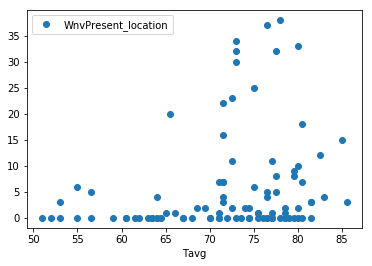

In [35]:
train_weather.plot(x='Tavg', y='WnvPresent_location', style='o')

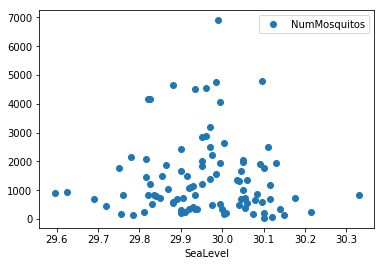

In [31]:
train_weather.plot(x='SeaLevel', y='NumMosquitos', style='o')

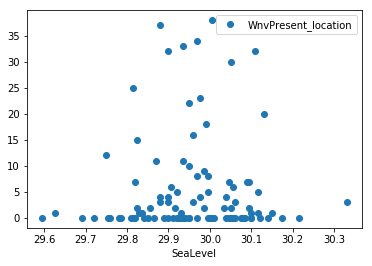

In [30]:
train_weather.plot(x='SeaLevel', y='WnvPresent_location', style='o')

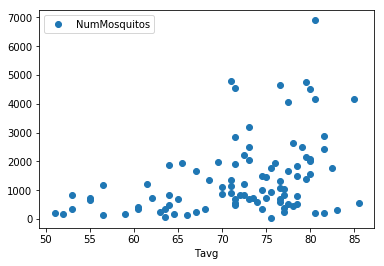

In [37]:
train_weather.plot(x='Tavg', y='NumMosquitos', style='o')

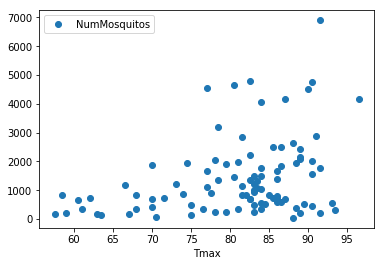

In [26]:
train_weather.plot(x='Tmax', y='NumMosquitos', style='o')

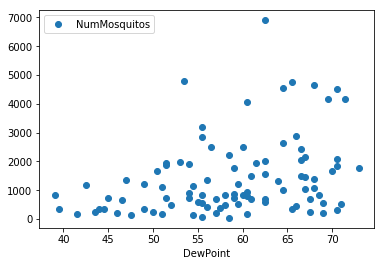

In [38]:
train_weather.plot(x='DewPoint', y='NumMosquitos', style='o')

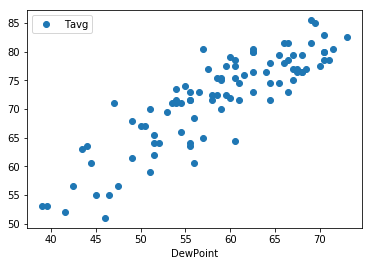

In [39]:
train_weather.plot(x='DewPoint', y='Tavg', style='o')

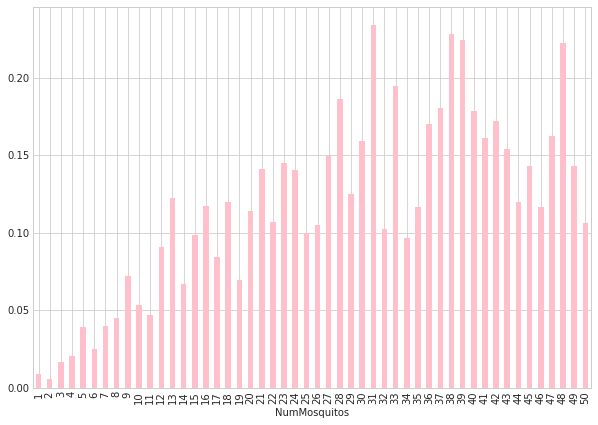

In [91]:
plt.figure(figsize=(10,7))
train.groupby(['NumMosquitos'])['WnvPresent'].mean().plot.bar(color='pink')

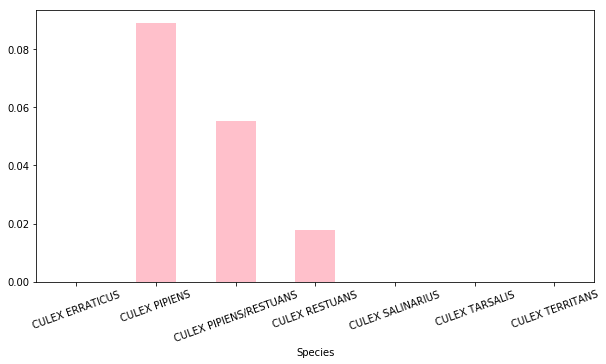

In [22]:
plt.figure(figsize=(10,5))
train.groupby(['Species'])['WnvPresent'].mean().plot.bar(color='pink', rot=20)

In [204]:
traps_jun = train[train.Date.str[:7] == '2007-06']
traps_jul = train[train.Date.str[:7] == '2007-07']
traps_aug = train[train.Date.str[:7] == '2007-08']
traps_sep = train[train.Date.str[:7] == '2007-09']
traps_oct = train[train.Date.str[:7] == '2007-10']

print(traps_jun.WnvPresent.sum())
print(traps_jul.WnvPresent.sum())
print(traps_aug.WnvPresent.sum())
print(traps_sep.WnvPresent.sum())
print(traps_oct.WnvPresent.sum())

print(traps_jun.NumMosquitos.sum())
print(traps_jul.NumMosquitos.sum())
print(traps_aug.NumMosquitos.sum())
print(traps_sep.NumMosquitos.sum())
print(traps_oct.NumMosquitos.sum())

0
6
200
28
2
428
7199
40015
9300
1706


In [203]:
traps_jun = train[train.Date.str[:7] == '2009-06']
traps_jul = train[train.Date.str[:7] == '2009-07']
traps_aug = train[train.Date.str[:7] == '2009-08']
traps_sep = train[train.Date.str[:7] == '2009-09']
traps_oct = train[train.Date.str[:7] == '2009-10']

print(traps_jun.WnvPresent.sum())
print(traps_jul.WnvPresent.sum())
print(traps_aug.WnvPresent.sum())
print(traps_sep.WnvPresent.sum())
print(traps_oct.WnvPresent.sum())

print(traps_jun.NumMosquitos.sum())
print(traps_jul.NumMosquitos.sum())
print(traps_aug.NumMosquitos.sum())
print(traps_sep.NumMosquitos.sum())
print(traps_oct.NumMosquitos.sum())

0
5
9
5
0
7390
8833
2346
2137
212


In [50]:
traps_jun = train[train.Date.str[:7] == '2011-06']
traps_jul = train[train.Date.str[:7] == '2011-07']
traps_aug = train[train.Date.str[:7] == '2011-08']
traps_sep = train[train.Date.str[:7] == '2011-09']
traps_oct = train[train.Date.str[:7] == '2011-10']

print(traps_jun.WnvPresent.sum())
print(traps_jul.WnvPresent.sum())
print(traps_aug.WnvPresent.sum())
print(traps_sep.WnvPresent.sum())
print(traps_oct.WnvPresent.sum())

0
11
24
22
0


In [52]:
traps_jun = train[train.Date.str[:7] == '2013-06']
traps_jul = train[train.Date.str[:7] == '2013-07']
traps_aug = train[train.Date.str[:7] == '2013-08']
traps_sep = train[train.Date.str[:7] == '2013-09']
traps_oct = train[train.Date.str[:7] == '2013-10']

print(traps_jun.WnvPresent.sum())
print(traps_jul.WnvPresent.sum())
print(traps_aug.WnvPresent.sum())
print(traps_sep.WnvPresent.sum())
print(traps_oct.WnvPresent.sum())

1
24
144
70
0


In [64]:
traps_2007 = train[train.Date.str[:4] == '2007']
traps_2009 = train[train.Date.str[:4] == '2009']
traps_2011 = train[train.Date.str[:4] == '2011']
traps_2013 = train[train.Date.str[:4] == '2013']

spray_2011 = spray[spray.Date.str[:4] == '2011']
spray_2013 = spray[spray.Date.str[:4] == '2013']

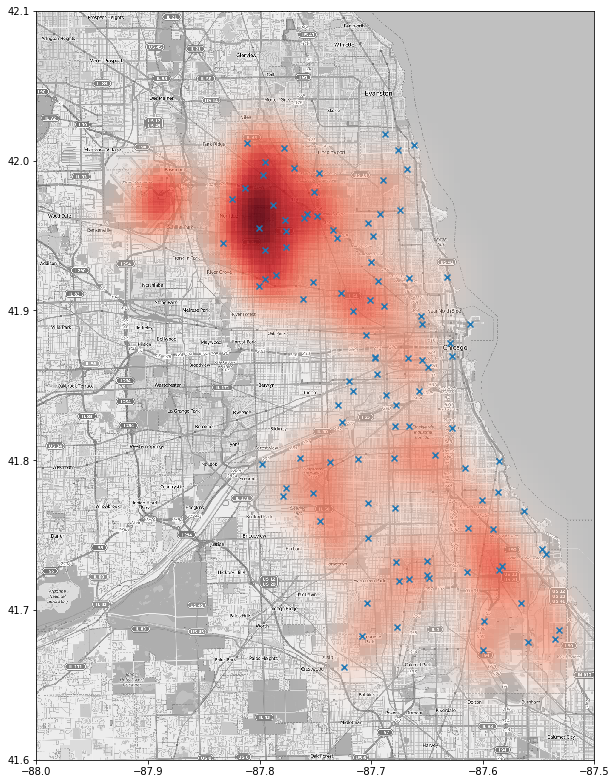

In [34]:
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = train[train['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

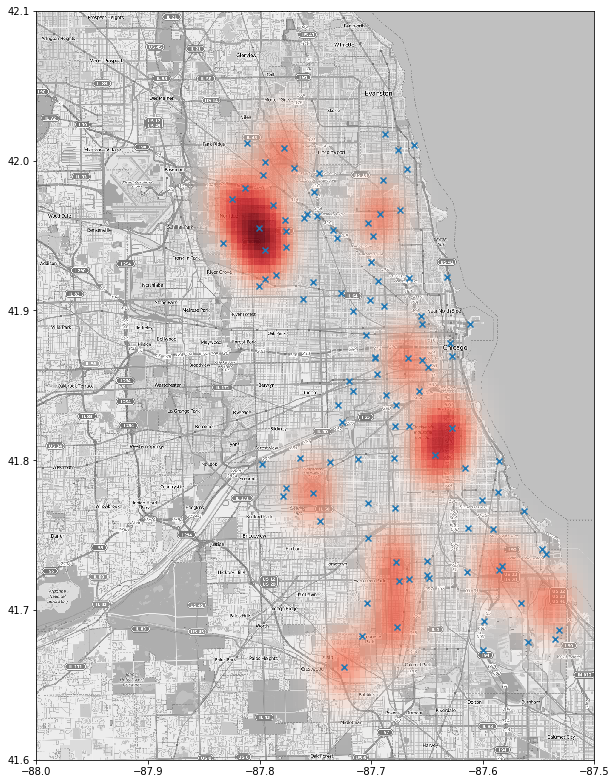

In [35]:
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps_aug[traps_aug['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

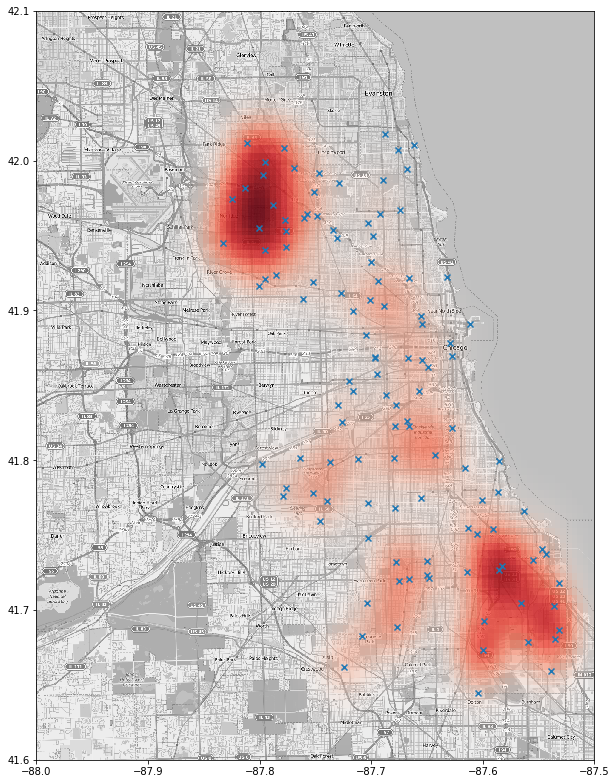

In [62]:
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps_2007[traps_2007['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps_2007[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

plt.savefig('/mnt/lynx/python_tutorial/heatmap2007.png')

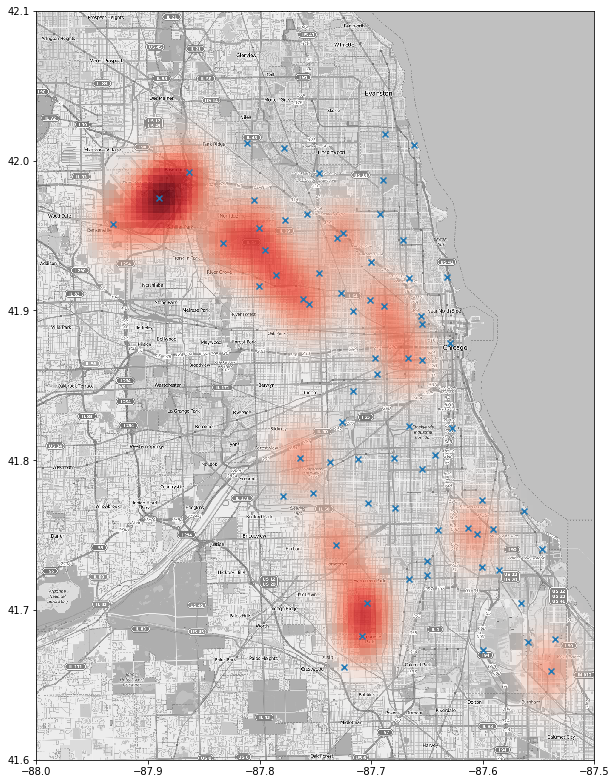

In [61]:
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps_2009[traps_2009['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps_2009[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

plt.savefig('/mnt/lynx/python_tutorial/heatmap2009.png')

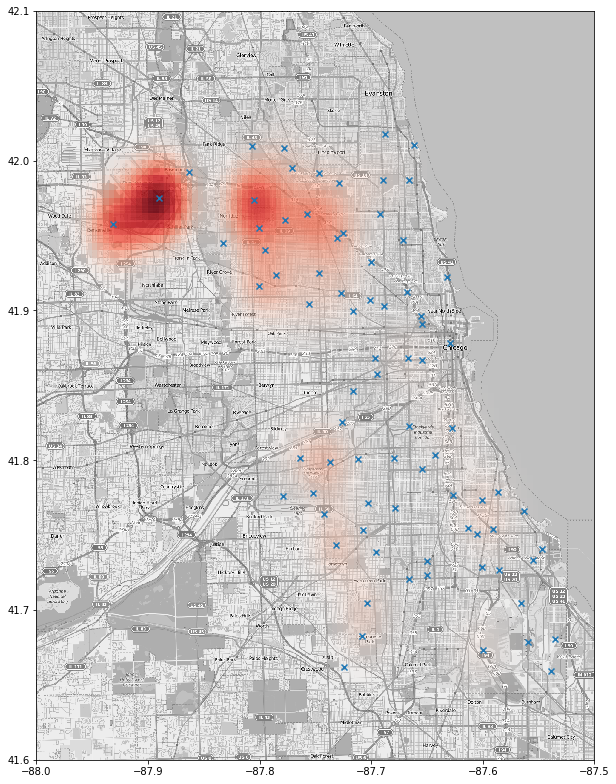

In [60]:
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps_2011[traps_2011['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps_2011[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

plt.savefig('/mnt/lynx/python_tutorial/heatmap2011.png')

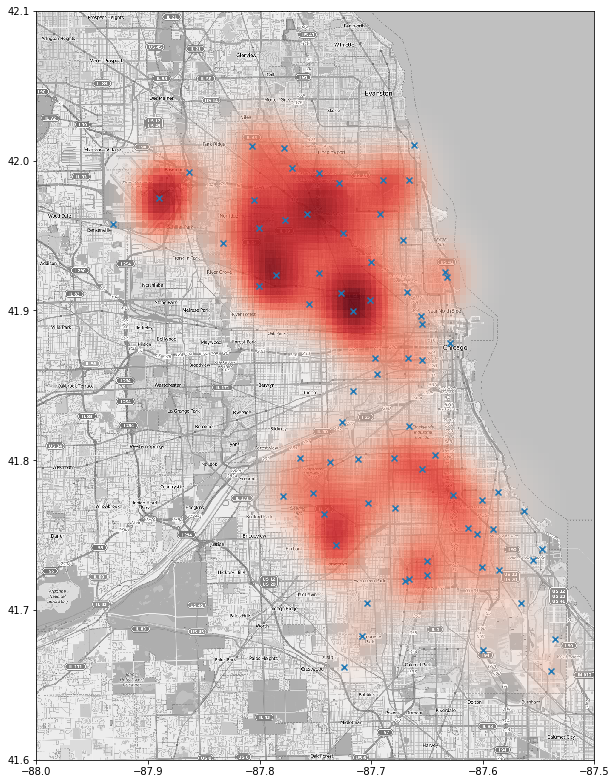

In [59]:
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps_2013[traps_2013['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps_2013[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

plt.savefig('/mnt/lynx/python_tutorial/heatmap2013.png')

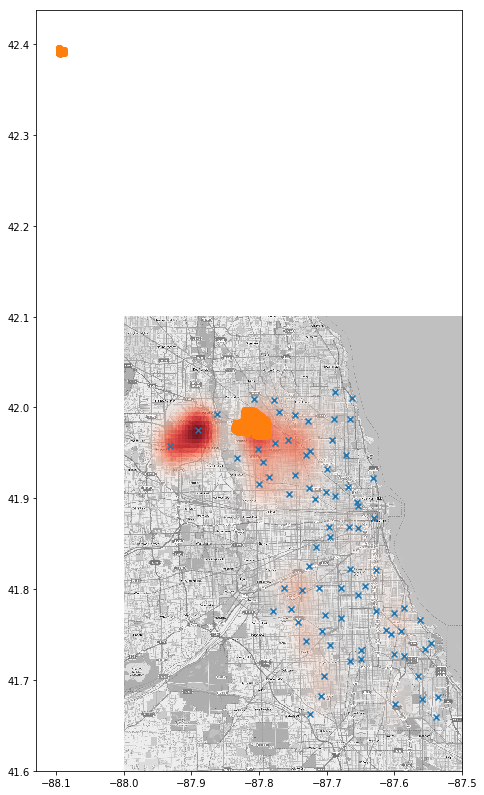

In [65]:
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps_2011[traps_2011['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps_2011[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

locations_spray = spray_2011[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations_spray[:,0], locations_spray[:,1], marker='o')

plt.savefig('/mnt/lynx/python_tutorial/heatmap2011_withspray.png')

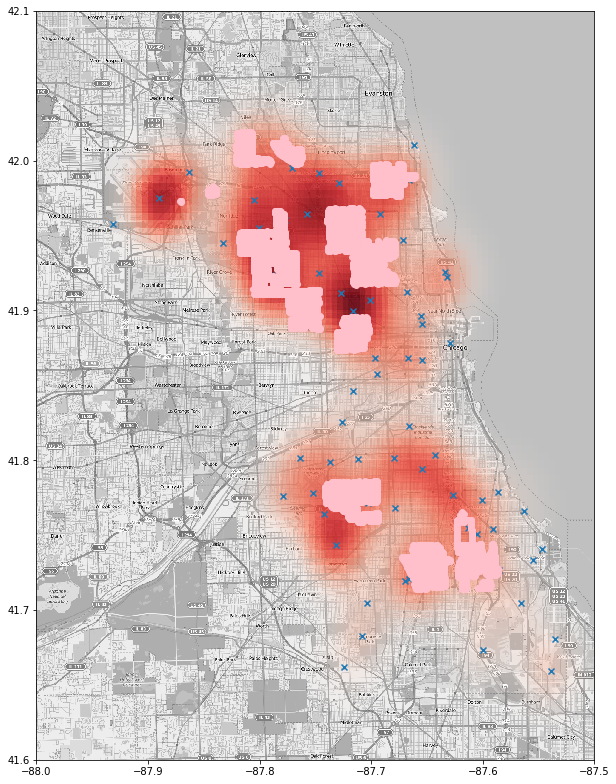

In [76]:
alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps_2013[traps_2013['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps_2013[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

locations_spray = spray_2013[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations_spray[:,0], locations_spray[:,1], marker='o', color='pink')


plt.savefig('/mnt/lynx/python_tutorial/heatmap2013_withspray.png')

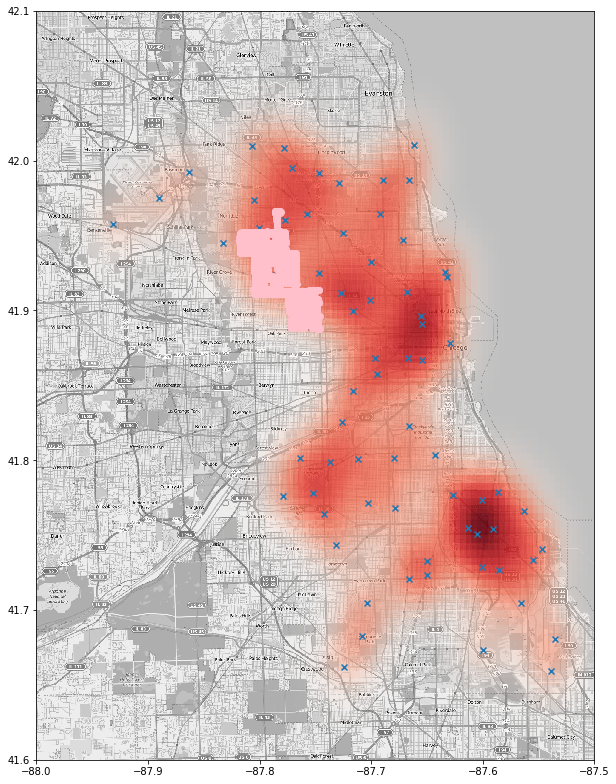

In [217]:
traps = train[train.Date.str[:10] == '2013-08-22']
spray_map = spray[spray.Date.str[:10] == '2013-08-15']

alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps[traps['NumMosquitos'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).sum()['NumMosquitos'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

locations_spray = spray_map[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations_spray[:,0], locations_spray[:,1], marker='o', color='pink')


# plt.savefig('/mnt/lynx/python_tutorial/heatmap.png')

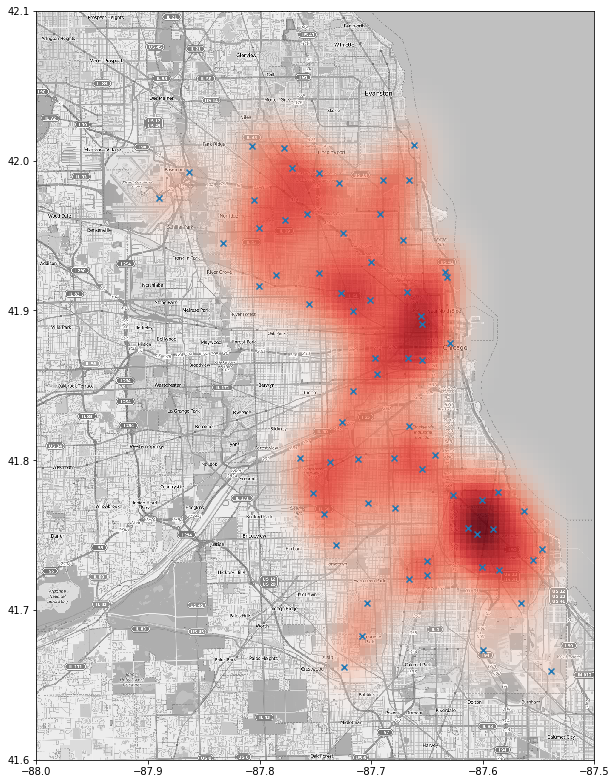

In [218]:
traps = train[train.Date.str[:10] == '2013-08-15']
spray_map = spray[spray.Date.str[:10] == '2013-08-15']

alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps[traps['NumMosquitos'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).sum()['NumMosquitos'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

# locations_spray = spray_map[['Longitude', 'Latitude']].drop_duplicates().values
# plt.scatter(locations_spray[:,0], locations_spray[:,1], marker='o', color='pink')


# plt.savefig('/mnt/lynx/python_tutorial/heatmap.png')

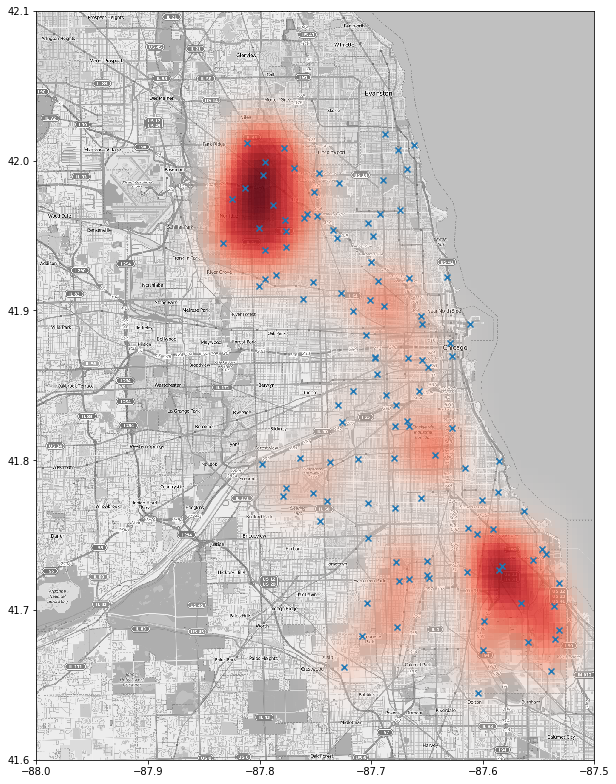

In [210]:
traps = train[train.Date.str[:7] == '2007-08']

alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps[traps['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

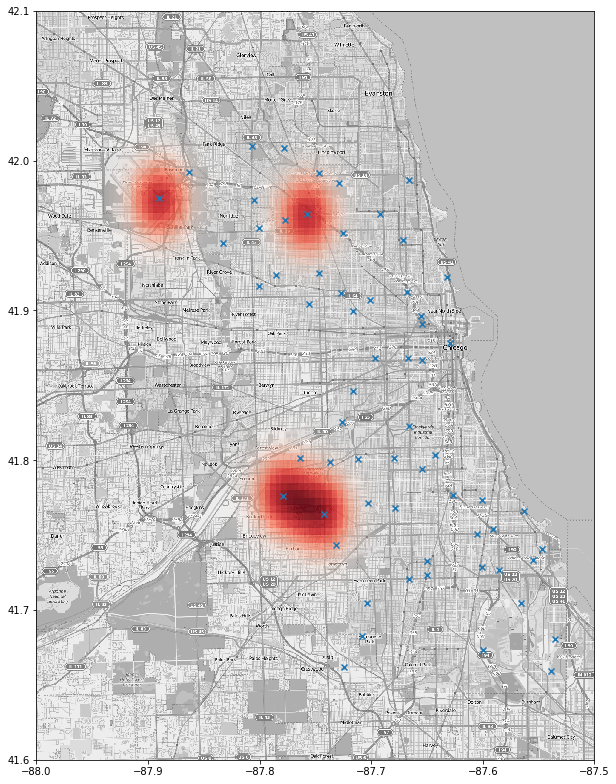

In [53]:
var = '2013-09-26'

traps = train[train.Date.str[:10] == var]
spray_map = spray[spray.Date.str[:10] == '2013-09-05']

alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps[traps['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

# locations_spray = spray_map[['Longitude', 'Latitude']].drop_duplicates().values
# plt.scatter(locations_spray[:,0], locations_spray[:,1], marker='o', color='pink')

plt.savefig('/mnt/lynx/python_tutorial/' + var + 'png')

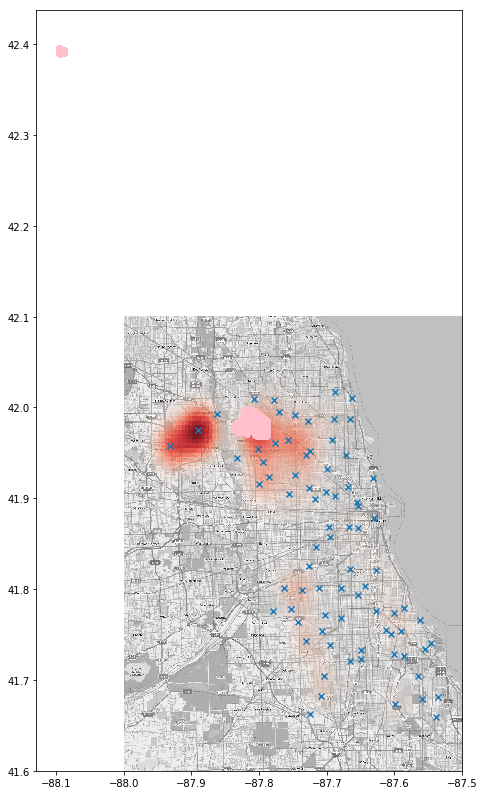

In [54]:
var = '2011'

traps = train[train.Date.str[:4] == var]
spray_map = spray[spray.Date.str[:4] == var]

alpha_cm = plt.cm.Reds
alpha_cm._init()
alpha_cm._lut[:-3,-1] = abs(np.logspace(0, 1, alpha_cm.N) / 10 - 1)[::-1]
aspect = mapdata.shape[0] * 1.0 / mapdata.shape[1]
lon_lat_box = (-88, -87.5, 41.6, 42.1)

sigthings = traps[traps['WnvPresent'] > 0]
sigthings = sigthings.groupby(['Date', 'Trap','Longitude', 'Latitude']).max()['WnvPresent'].reset_index()
X = sigthings[['Longitude', 'Latitude']].values
kd = KernelDensity(bandwidth=0.02)
kd.fit(X)

xv,yv = np.meshgrid(np.linspace(-88, -87.5, 100), np.linspace(41.6, 42.1, 100))
gridpoints = np.array([xv.ravel(),yv.ravel()]).T
zv = np.exp(kd.score_samples(gridpoints).reshape(100,100))
plt.figure(figsize=(10,14))
plt.imshow(mapdata, 
           cmap=plt.get_cmap('gray'), 
           extent=lon_lat_box, 
           aspect=aspect)
plt.imshow(zv, 
           origin='lower', 
           cmap=alpha_cm, 
           extent=lon_lat_box, 
           aspect=aspect)

locations = traps[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations[:,0], locations[:,1], marker='x')

locations_spray = spray_map[['Longitude', 'Latitude']].drop_duplicates().values
plt.scatter(locations_spray[:,0], locations_spray[:,1], marker='o', color='pink')

plt.savefig('/mnt/lynx/python_tutorial/spray_' + var + 'png')